In [1]:
!pip install --upgrade albumentations

Requirement already up-to-date: albumentations in c:\users\pc\anaconda3\lib\site-packages (0.4.5)


In [2]:
! pip install --upgrade pydicom

Requirement already up-to-date: pydicom in c:\users\pc\anaconda3\lib\site-packages (2.0.0)


In [3]:
! pip install --upgrade Pillow

Requirement already up-to-date: Pillow in c:\users\pc\anaconda3\lib\site-packages (7.1.2)


In [4]:
! pip install numpy

In [5]:
! pip install opencv-python

## imports

In [6]:
import os
import albumentations as A
import numpy as np
import pandas as pd
# import dlib
# import torch
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pydicom as dicom
from PIL import Image

%matplotlib inline

In [7]:
def show_image(image):
    """
    The function used to display input image.
    @param image: array-like or PIL image representation.    
    """
    plt.figure(figsize=(9, 9))
    plt.imshow(image, cmap = 'gray')

In [8]:
test_path = '/Users/pc/Desktop/test.jpeg'   # /Users/pc/Desktop/test.jpeg     test.jpeg
rgb_path = '/Users/pc/Desktop/rgb.jpg'      # /Users/pc/Desktop/rgb.jpg       rgb.jpg
path_chest = '/Users/pc/Desktop/image.dcm'  # /Users/pc/Desktop/image.dcm     image.dcm
path_mask = '/Users/pc/Desktop/mask.dcm'    # /Users/pc/Desktop/mask.dcm      mask.dcm

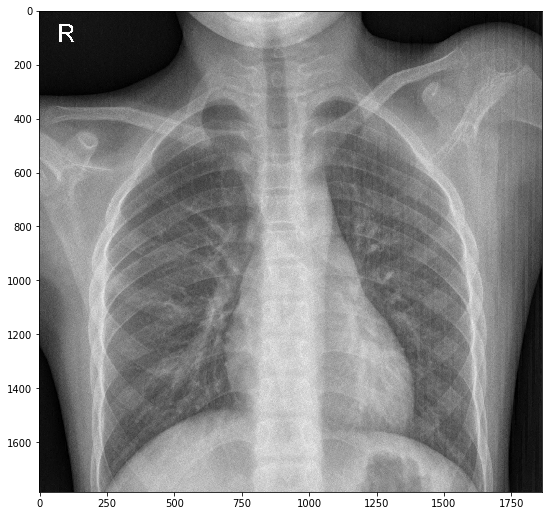

In [9]:
img = plt.imread(test_path)
show_image(img)

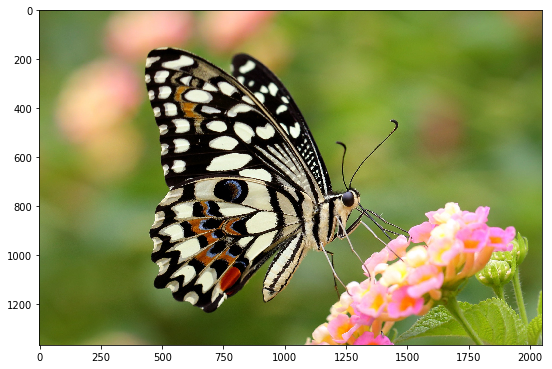

In [10]:
rgb = plt.imread(rgb_path)
show_image(rgb)

In [11]:
def show_augmented(augmentation, image):
    """
    The function used to display input image with specified augmentation.
    @param augmentation: augmentation function included in Albumentation package.
    @param image: array-like or PIL image representation.    
    """
    augmented = augmentation(image=image)
    show_image(augmented['image'])

# Quality reduction

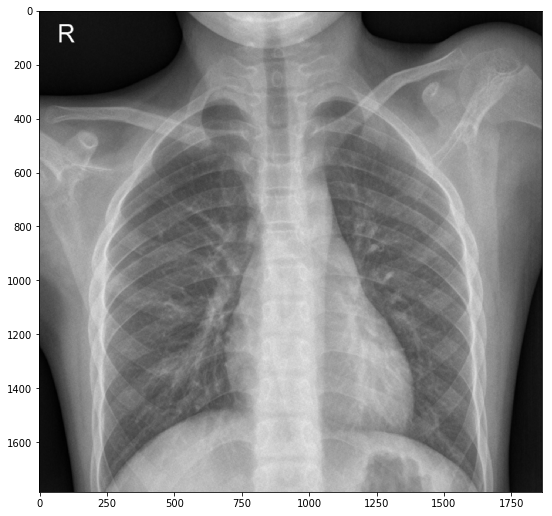

In [12]:
# Blur
blur = A.Blur(blur_limit=60, p=1)
show_augmented(blur, img)

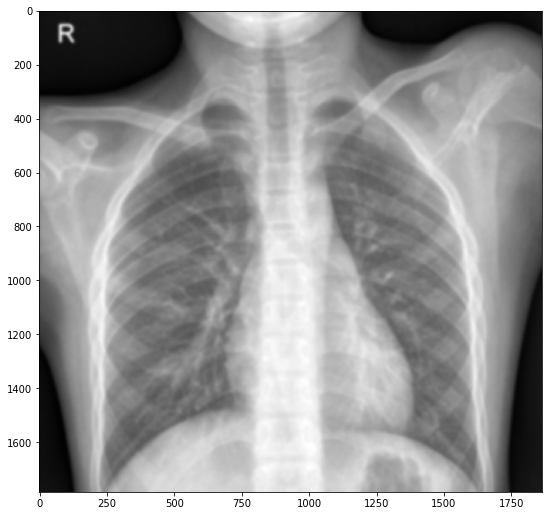

In [13]:
# Gauss Blur
Gauss_Blur = A.GaussianBlur(blur_limit=50, always_apply=False, p=1)
show_augmented(Gauss_Blur, img)

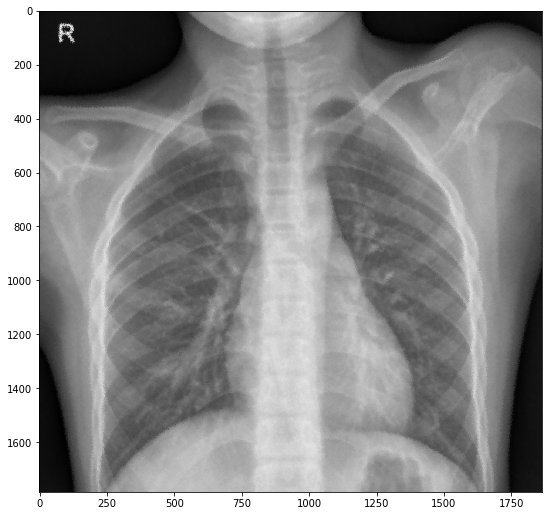

In [14]:
# Glass Blur
Glass_Blur = A.GlassBlur(sigma=0.7, max_delta=4, iterations=2, always_apply=False, mode='fast', p=1)
show_augmented(Glass_Blur, img)

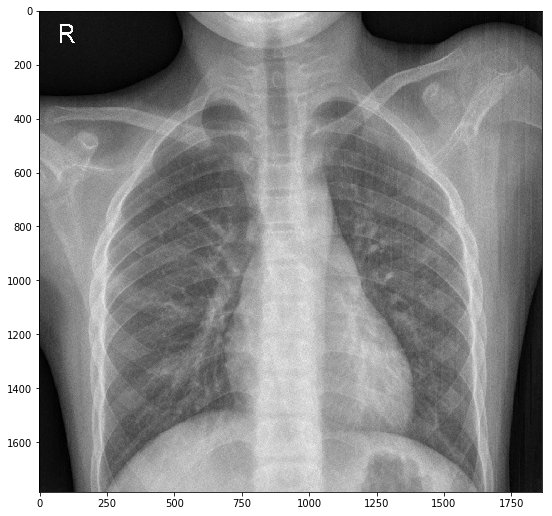

In [15]:
# DownScale
Down_Scale = A.Downscale(scale_min=0.1, scale_max=0.9, interpolation=0, always_apply=False, p=1)
show_augmented(Down_Scale, img)

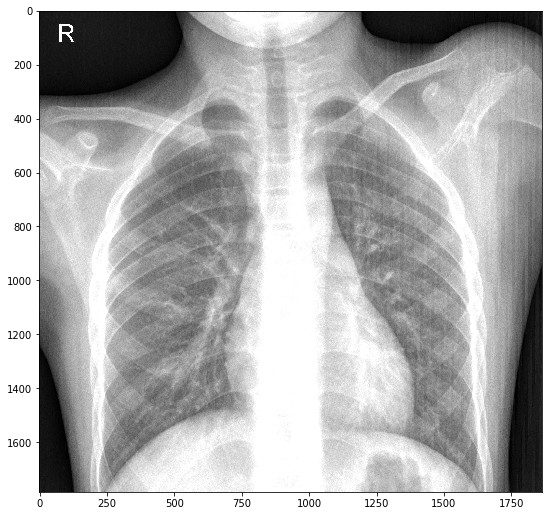

In [16]:
# MultiplicativeNoise
MultiplicativeNoise = A.MultiplicativeNoise(multiplier=(0.9, 1.5), per_channel=False, elementwise=False, always_apply=False, p=1)
show_augmented(MultiplicativeNoise, img)

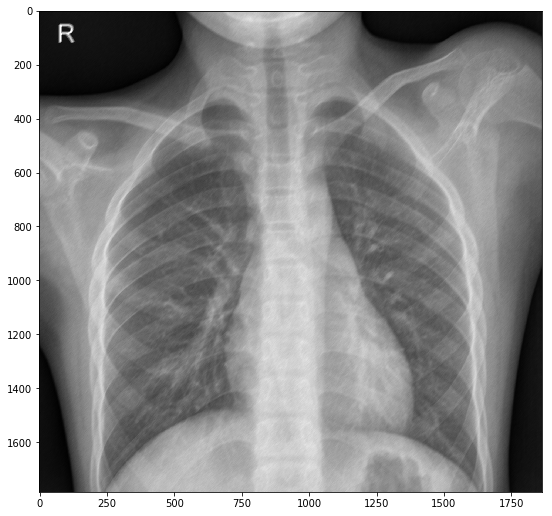

In [17]:
# MotionBlur
MotionBlur = A.MotionBlur(blur_limit=20, always_apply=False, p=1)
show_augmented(MotionBlur, img)

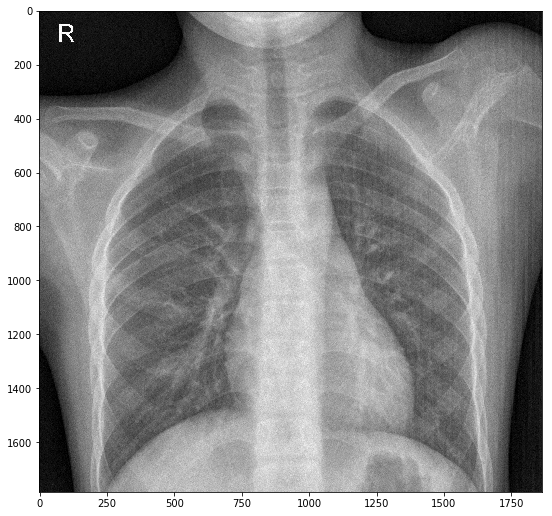

In [18]:
# IAAAdditiveGaussianNoise
IAAAdditiveGaussianNoise = A.IAAAdditiveGaussianNoise(loc=0, scale=(3, 12.75), per_channel=False, always_apply=False, p=1)
show_augmented(IAAAdditiveGaussianNoise, img)

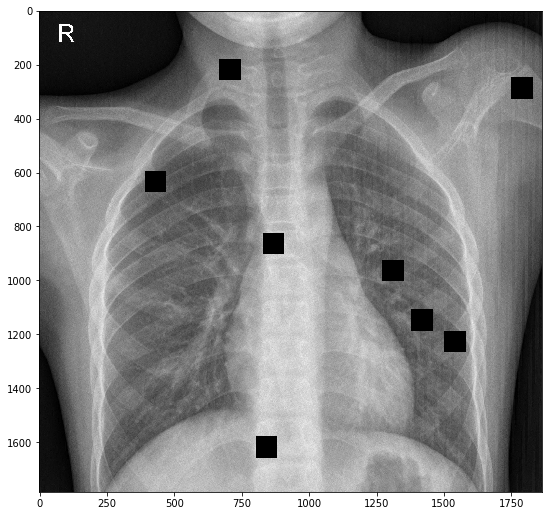

In [19]:
# Coarse Dropout
Coarse_Dropout = A.CoarseDropout(max_holes=8, max_height=80, max_width=80, min_holes=None, min_height=None, min_width=None, fill_value=0, always_apply=False, p=1)
show_augmented(Coarse_Dropout, img)

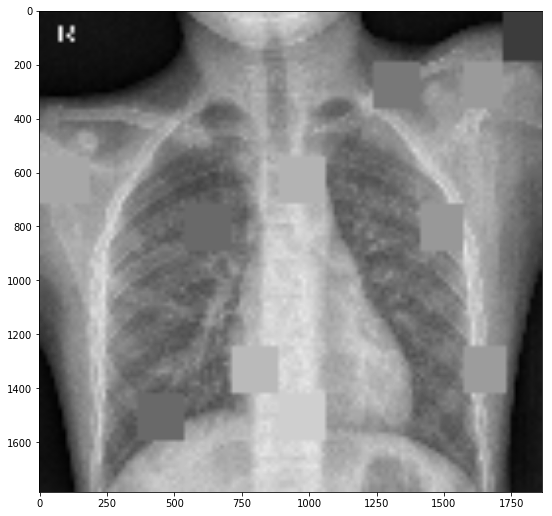

In [20]:
# IAASuperpixels
IAASuperpixels = A.IAASuperpixels(p_replace=0.1, n_segments=100, always_apply=False, p=1)
show_augmented(IAASuperpixels, img)

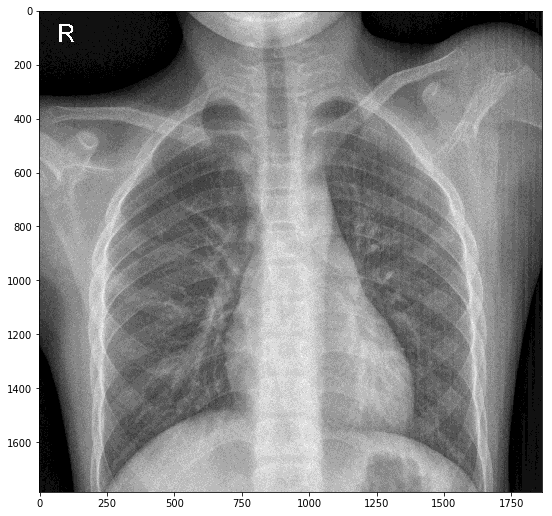

In [21]:
# Posterize
Posterize = A.Posterize(num_bits=4, always_apply=False, p=1)
show_augmented(Posterize, img)

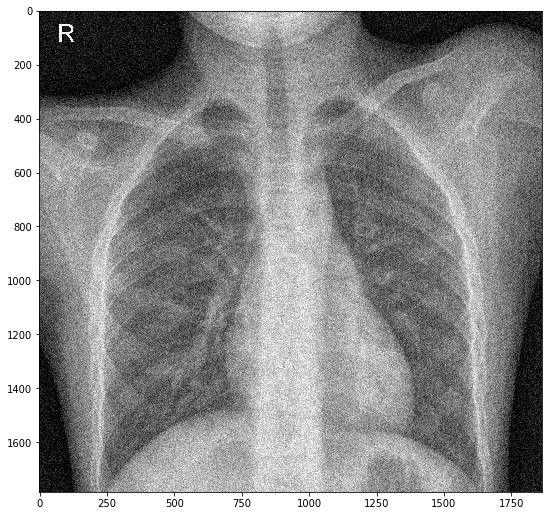

In [22]:
# Gauss Noise
Gauss_Noise = A.GaussNoise(var_limit=(400.0, 500.0), mean=0, always_apply=False, p=1)
show_augmented(Gauss_Noise, img)

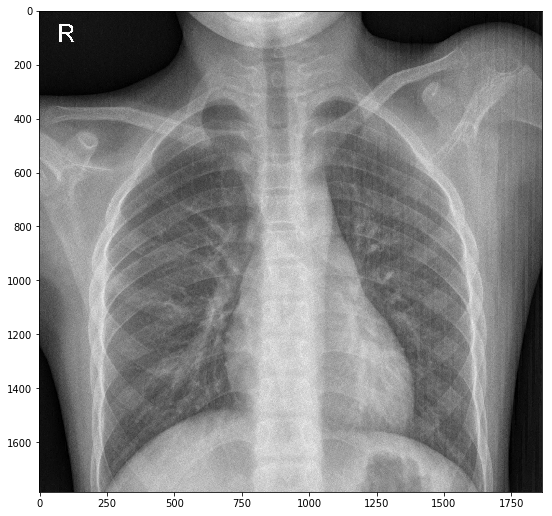

In [23]:
# ImageCompression
ImageCompression = A.ImageCompression(quality_lower=1, quality_upper=100, always_apply=True, p=1)
show_augmented(ImageCompression, img)

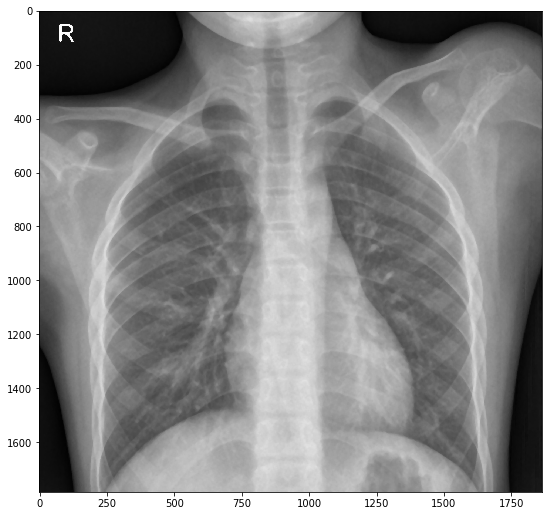

In [24]:
# MedianBlur
MedianBlur = A.MedianBlur(blur_limit=20, always_apply=False, p=1)
show_augmented(MedianBlur, img)

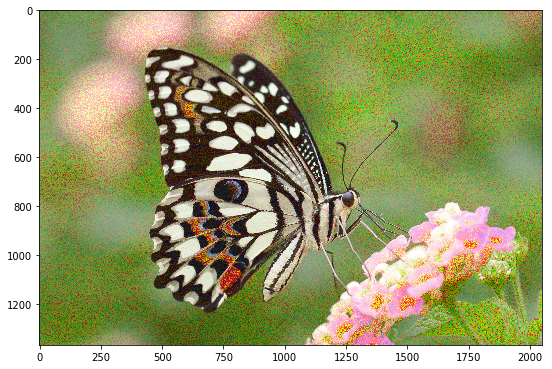

In [25]:
# ISONoise
ISONoise = A.ISONoise(color_shift=(0.05, 0.5), intensity=(0.1, 0.9), always_apply=False, p=1)
show_augmented(ISONoise, rgb)

# Histogram Equalization

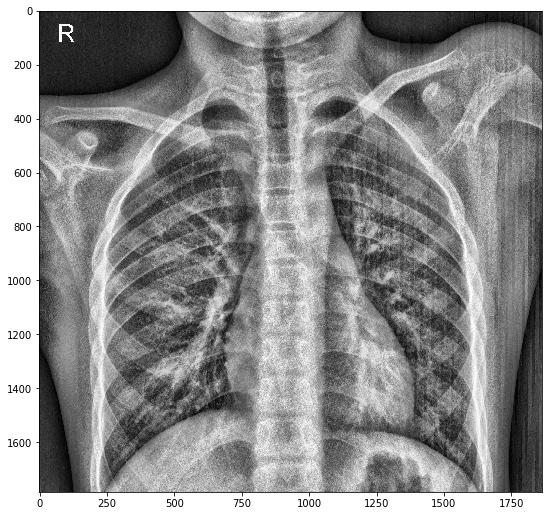

In [26]:
# CLAHE
CLAHE = A.CLAHE(clip_limit=(1,3), tile_grid_size=(15,15), p=1)
show_augmented(CLAHE, img)

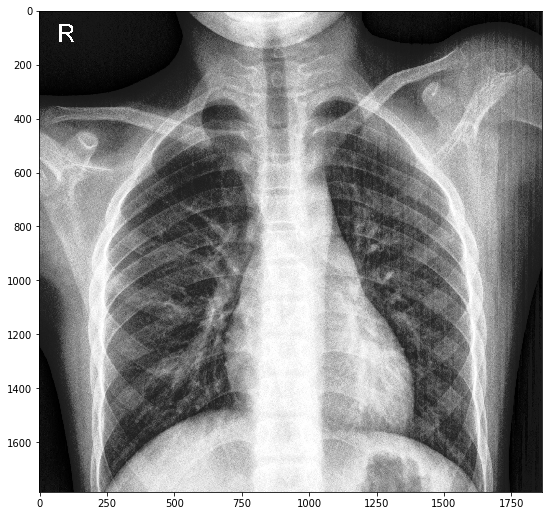

In [27]:
# Equalize
Equalize = A.Equalize(mode='cv', by_channels=True, mask=None, mask_params=(), always_apply=False, p=1)
show_augmented(Equalize, img)

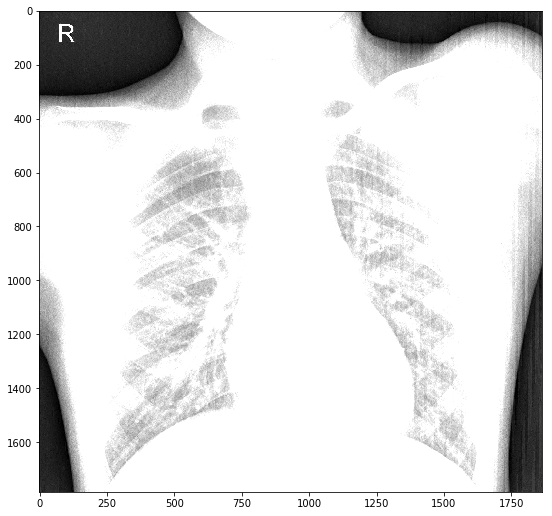

In [28]:
# RandomBrightnessContrast
RandomBrightnessContrast = A.RandomBrightnessContrast(brightness_limit=0.9, contrast_limit=0.9, brightness_by_max=True, always_apply=True, p=1)
show_augmented(RandomBrightnessContrast, img)

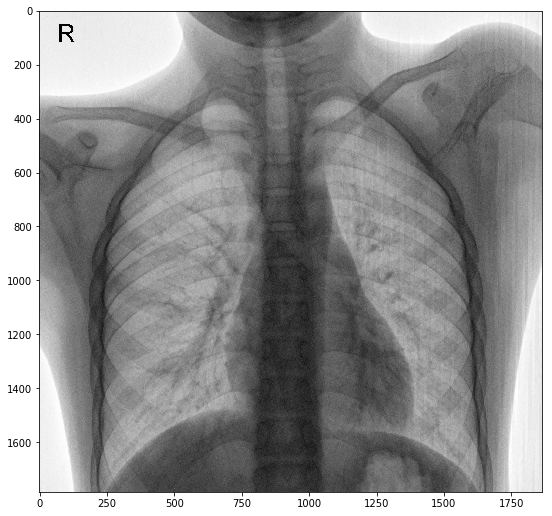

In [29]:
# InvertImg
InvertImg = A.InvertImg(always_apply=False, p=1)
show_augmented(InvertImg, img)

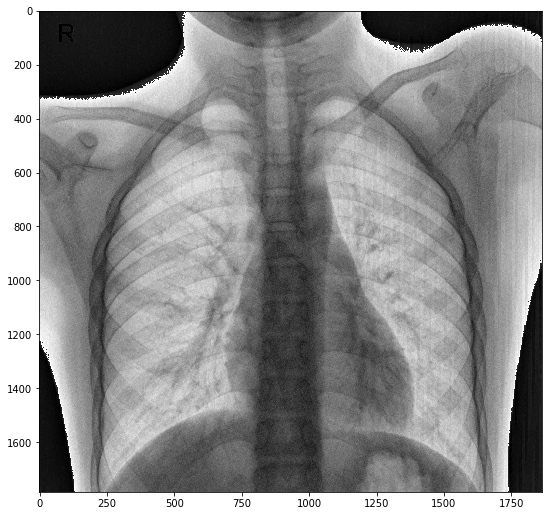

In [30]:
# Solarize
Solarize = A.Solarize(threshold=40, always_apply=False, p=1)
show_augmented(Solarize, img)

# Color Settings

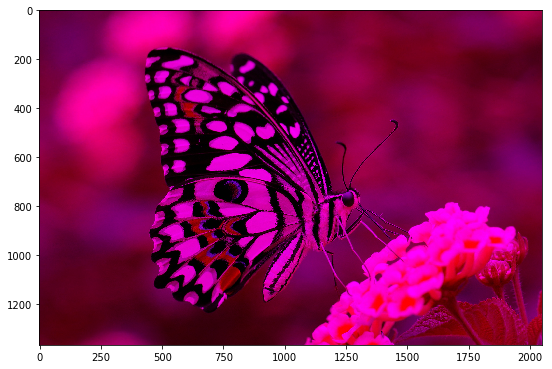

In [31]:
# Channel Dropout
Channel_Dropout = A.ChannelDropout(channel_drop_range=(1, 1), fill_value=0, always_apply=False, p=1)
show_augmented(Channel_Dropout, rgb)

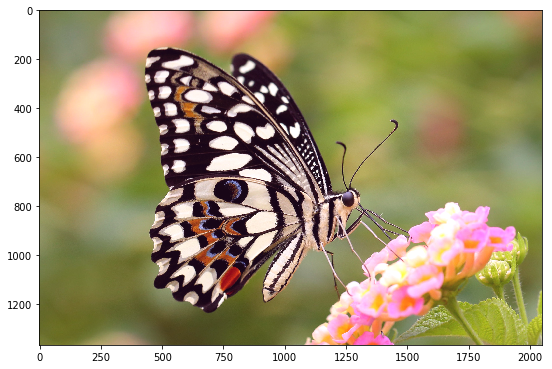

In [32]:
# FancyPCA
FancyPCA = A.FancyPCA(alpha=0.7, always_apply=False, p=1)
show_augmented(FancyPCA, rgb)

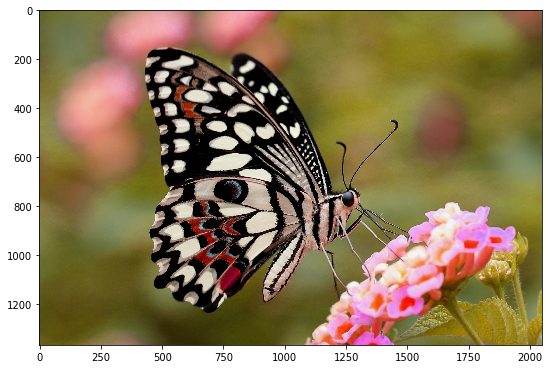

In [33]:
# Hue Saturation
Hue_Saturation = A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, always_apply=False, p=1)
show_augmented(Hue_Saturation, rgb)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


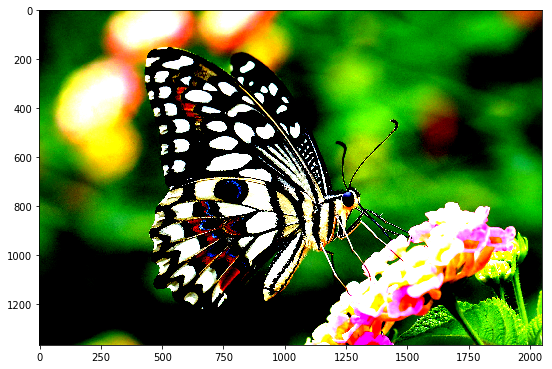

In [34]:
# Normalize
Normalize = A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0, always_apply=False, p=1.0)
show_augmented(Normalize, rgb)

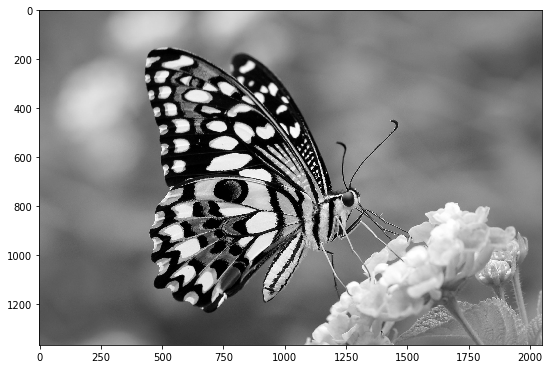

In [35]:
# ToGray
to_gray = A.ToGray(always_apply=False, p=1)
show_augmented(to_gray, rgb)

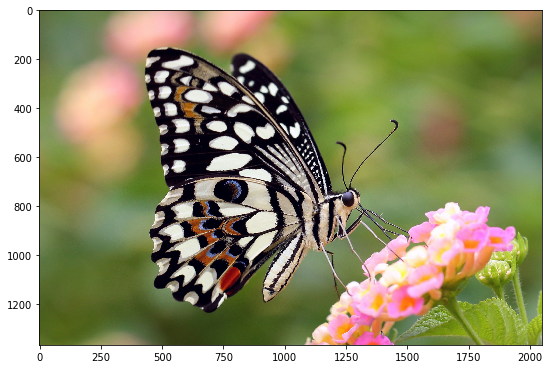

In [36]:
# RGBShift
RGBShift = A.RGBShift(r_shift_limit=20, g_shift_limit=20, b_shift_limit=20, always_apply=False, p=1)
show_augmented(RGBShift, rgb)

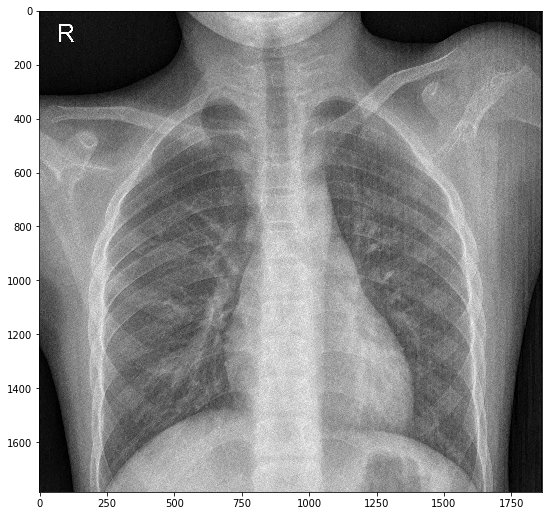

In [37]:
# IAAEmboss
IAAEmboss = A.IAAEmboss(alpha=(0.2, 0.5), strength=(0.2, 1), always_apply=False, p=1)
show_augmented(IAAEmboss, img)

# Image crop

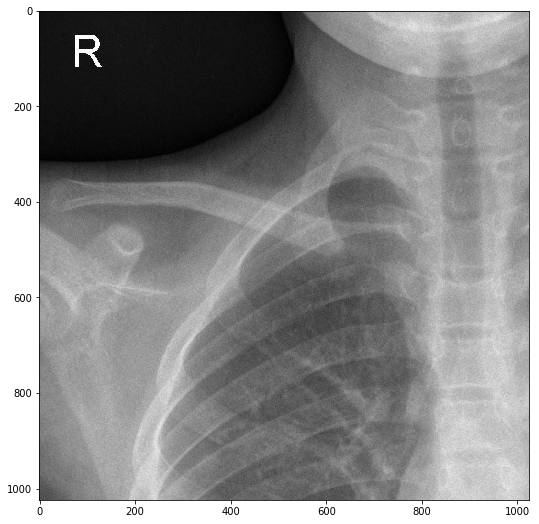

In [38]:
# Crop
Crop = A.Crop(x_min=0, y_min=0, x_max=1024, y_max=1024, always_apply=False, p=1.0)
show_augmented(Crop, img)

# Rotation

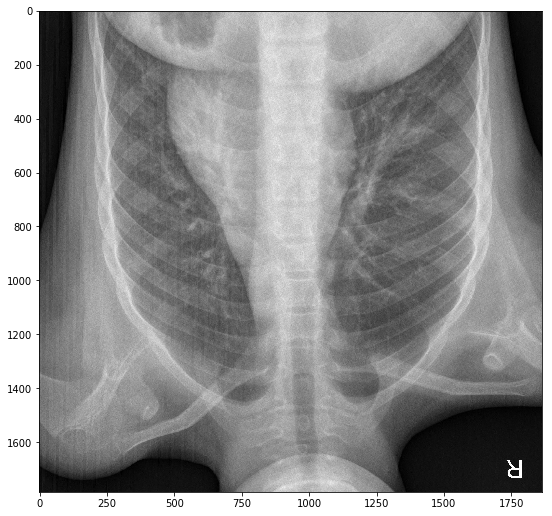

In [39]:
# Flip
Flip = A.Flip(always_apply=False, p=1)
show_augmented(Flip, img)

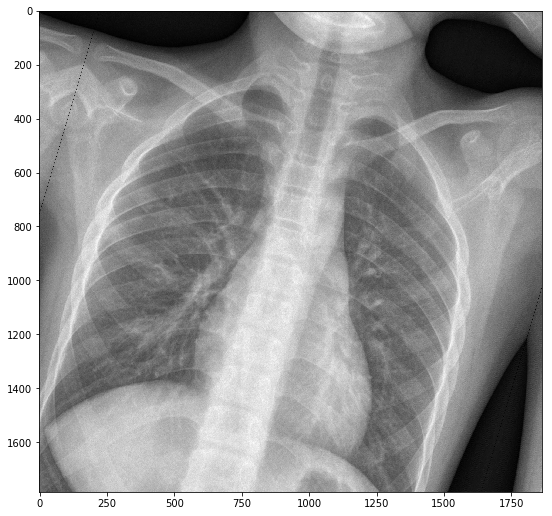

In [40]:
# Random Rotation
RR = A.Rotate(limit=90, interpolation=1, border_mode=4, value=None, mask_value=None, always_apply=False, p=1)
show_augmented(RR, img)

# Other Augmentations


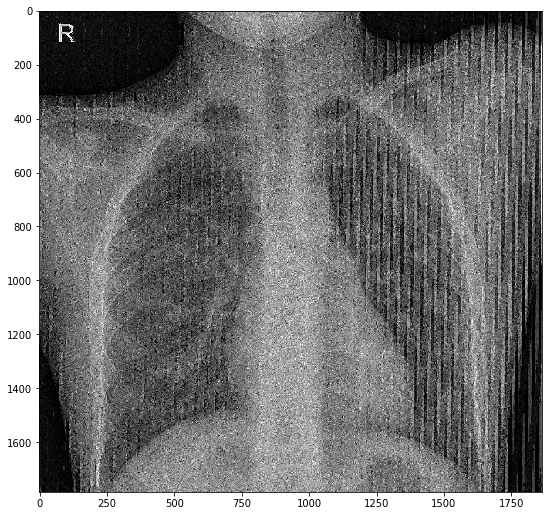

In [41]:
# IAASharpen
IAASharpen = A.IAASharpen(alpha=(0.8, 1), lightness=(0.5, 1.0), always_apply=False, p=1)
show_augmented(IAASharpen, img)

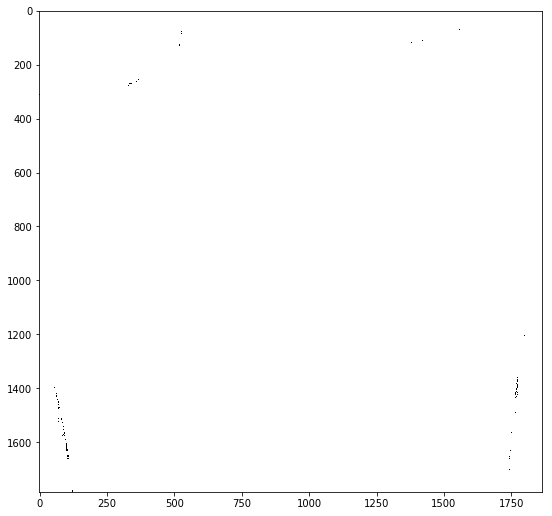

In [42]:
# FromFloat
FromFloat = A.FromFloat(dtype='uint16', max_value=None, always_apply=False, p=1.0)
show_augmented(FromFloat, img)

# DICOM

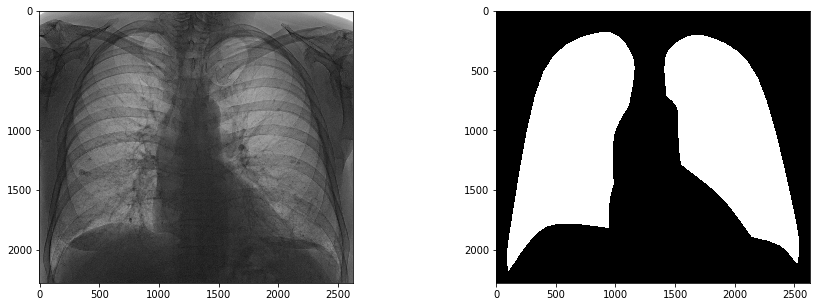

In [43]:
chest = dicom.dcmread(path_chest)
chest = chest.pixel_array
fig, ax = plt.subplots(1,2,figsize=(15,5))
ax[0].imshow(chest, cmap='gray')
mask = dicom.dcmread(path_mask)
mask = mask.pixel_array
ax[1].imshow(mask, cmap='gray')

In [44]:
type(mask)

numpy.ndarray

# Bounding box for mask

In [45]:
import cv2
non_zero_pixels = cv2.findNonZero(mask)

In [46]:
x, y, w, h = cv2.boundingRect(non_zero_pixels)

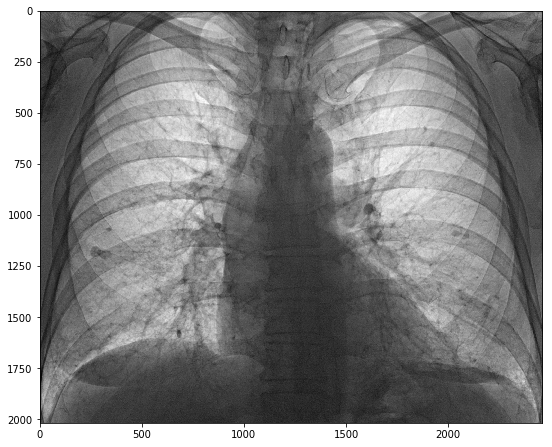

In [47]:
Crop = A.Crop(x_min=x-5, y_min=y-5, x_max=x+w+5, y_max=y+h+5, always_apply=False, p=1.0)
show_augmented(Crop, chest)

<class 'numpy.ndarray'>


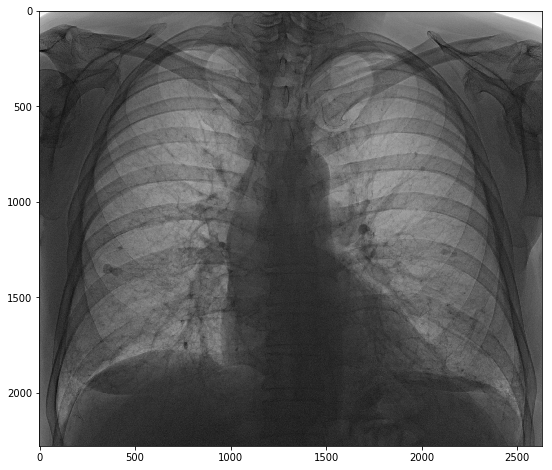

In [48]:
show_image(chest)
print(type(chest))

# Compose 

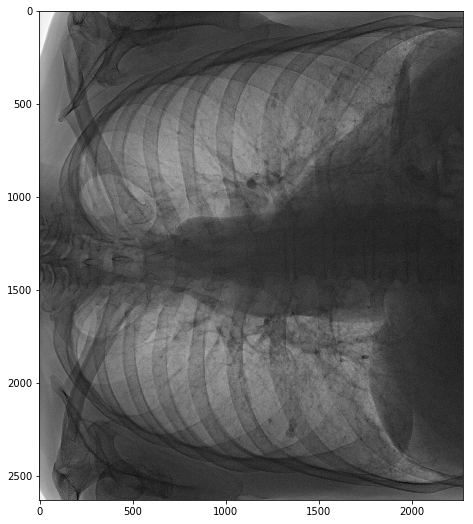

In [49]:
augmentation = A.Compose([
        A.RandomRotate90(),
        A.Flip(),
        A.Transpose(),
        A.OneOf([
            A.IAAAdditiveGaussianNoise(),
            A.GaussNoise(),
        ], p=0.2),
    ], p=1)

show_augmented(augmentation, chest)

In [50]:
def CropLungs(image, force_apply = False):
    # call segmentation module 
    # get the mask for input image
    mask = dicom.dcmread(path_mask).pixel_array
    
    non_zero_pixels = cv2.findNonZero(mask)
    x, y, w, h = cv2.boundingRect(non_zero_pixels)
    Crop = A.Crop(x_min=x-5, y_min=y-5, x_max=x+w+5, y_max=y+h+5, always_apply=False, p=1.0)
    augmented = Crop(image=image)
    return augmented

In [51]:
augmentation = A.Compose([CropLungs])

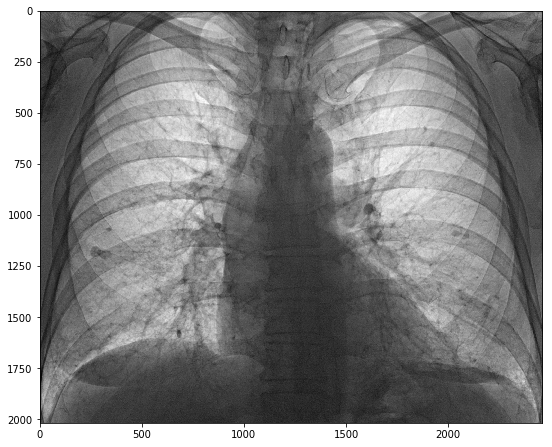

In [52]:
show_augmented(augmentation, chest)